In [1]:
import pandas as pd
import matplotlib
import geopandas as gpd
import PIL
import io

In [2]:
data=pd.read_csv('time_series_covid19_confirmed_global.csv')

# group the data by country

In [3]:
data=data.groupby('Country/Region').sum()

# drop the 'Lat' and 'Long' column

In [4]:
data=data.drop(columns=['Lat','Long'])
data.head()

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,...,9/4/20,9/5/20,9/6/20,9/7/20,9/8/20,9/9/20,9/10/20,9/11/20,9/12/20,9/13/20
Country/Region,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0,0,0,0,0,0,0,0,0,0,...,38304,38324,38398,38494,38520,38544,38572,38606,38641,38716
Albania,0,0,0,0,0,0,0,0,0,0,...,9967,10102,10255,10406,10553,10704,10860,11021,11185,11353
Algeria,0,0,0,0,0,0,0,0,0,0,...,45773,46071,46364,46653,46938,47216,47488,47752,48007,48254
Andorra,0,0,0,0,0,0,0,0,0,0,...,1215,1215,1215,1261,1261,1301,1301,1344,1344,1344
Angola,0,0,0,0,0,0,0,0,0,0,...,2876,2935,2965,2981,3033,3092,3217,3279,3335,3388


# create transpose of the data

In [5]:
data_transposed=data.T
data_transposed.head()

Country/Region,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Australia,Austria,...,United Kingdom,Uruguay,Uzbekistan,Venezuela,Vietnam,West Bank and Gaza,Western Sahara,Yemen,Zambia,Zimbabwe
1/22/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1/23/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1/24/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1/25/20,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,0,0,0
1/26/20,0,0,0,0,0,0,0,0,4,0,...,0,0,0,0,2,0,0,0,0,0


# printing the map

In [6]:
world=gpd.read_file('World_Map.shp')

# checking the name of the countries for boath data and world

In [7]:
# for index,row in data.iterrows():
#     if index not in world['NAME'].to_list():
#         print(index+' : not in list')
#     else:
#         pass


In [8]:
world.replace('United States','US',inplace=True)
world.replace('Taiwan','Taiwan*',inplace=True)
world.replace('Syrian Arab Republic','Syria',inplace=True)

In [9]:
merge=world.join(data,on='NAME',how='right')

# plot

/home/bunny/Desktop/covid_gif/venv/lib64/python3.8/site-packages/geopandas/plotting.py:589: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=figsize)


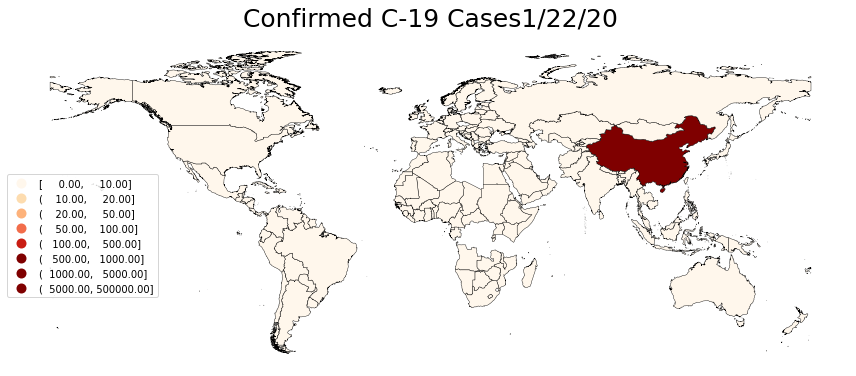

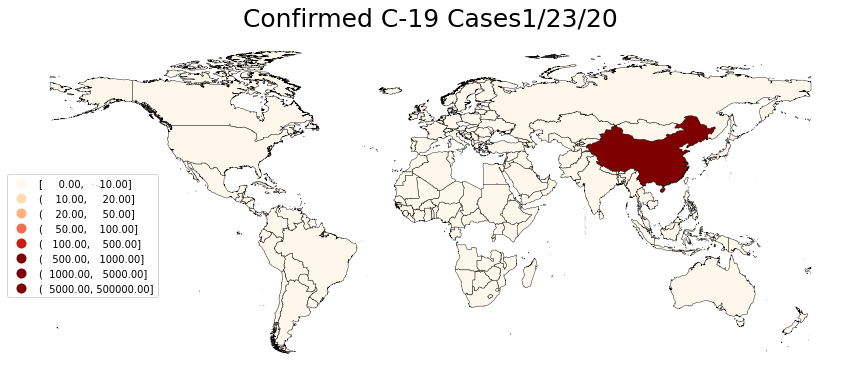

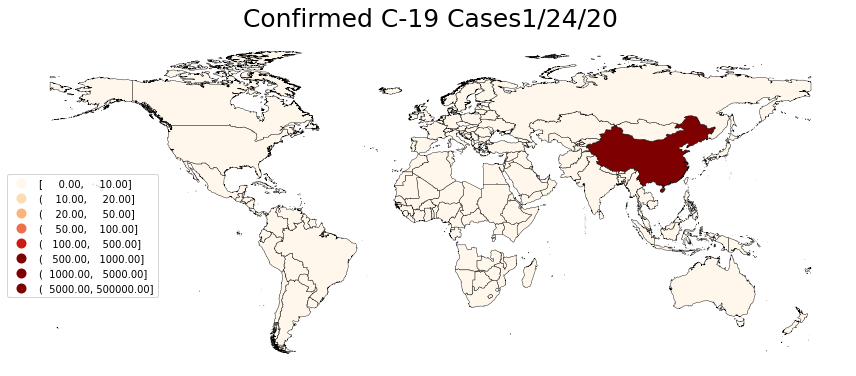

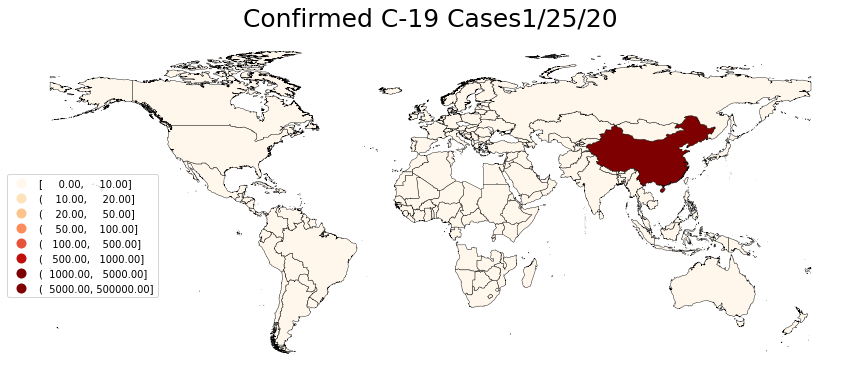

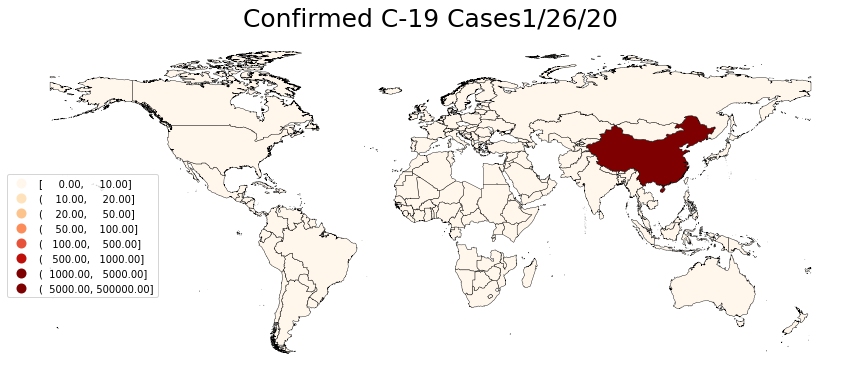

...

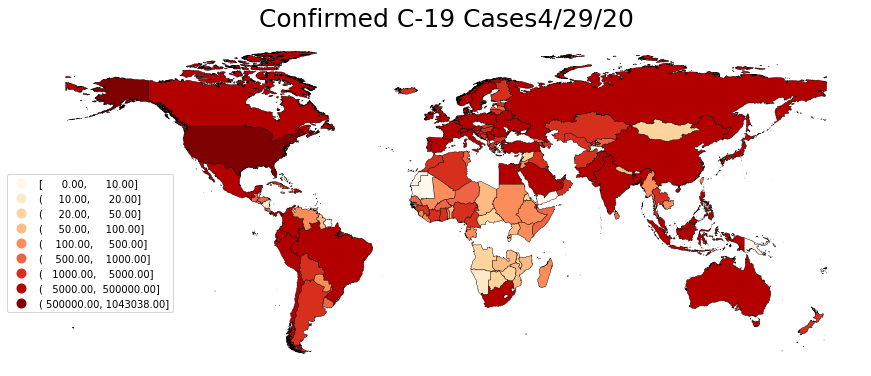

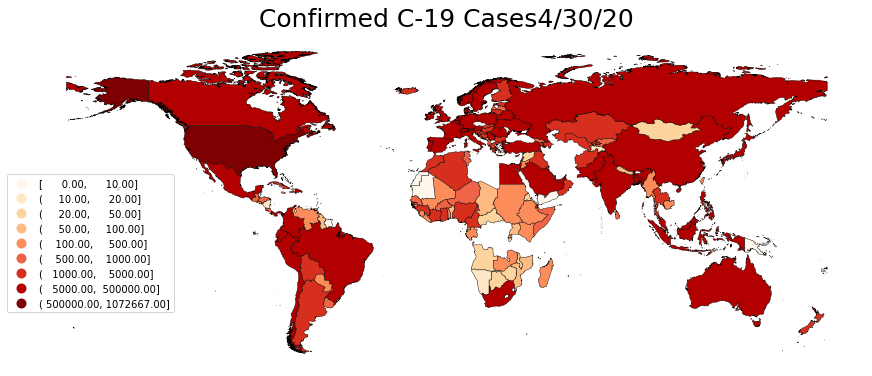

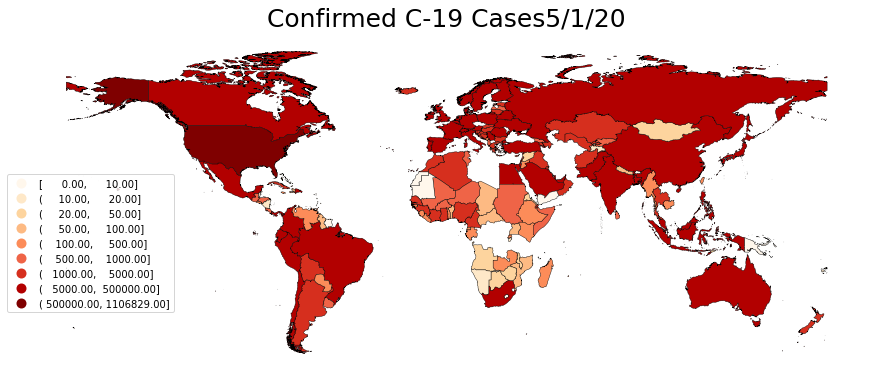

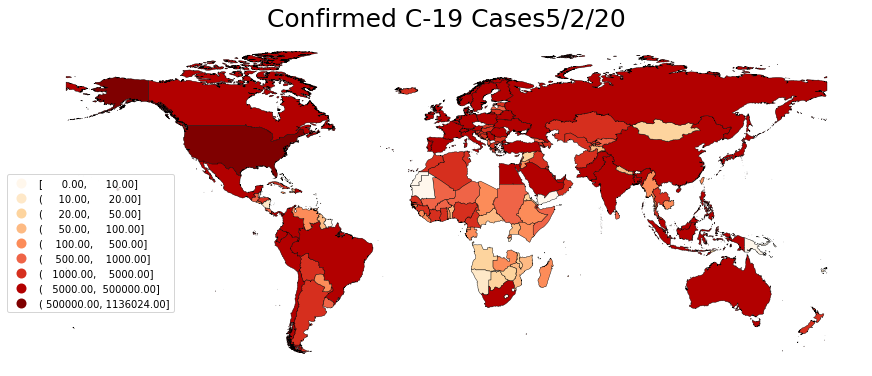

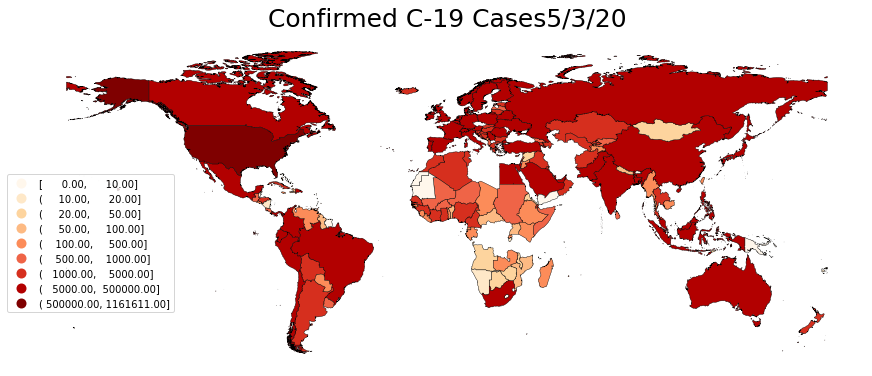

In [ ]:
image_frames=[]
for dates in merge.columns.to_list()[2:238]:  #238
    ax=merge.plot(column=dates,
                 cmap='OrRd',
                 figsize=(15,15),
                 legend=True,
                 scheme='user_defined',
                 classification_kwds={'bins':[10,20,50,100,500,1000,5000,500000]},
                 edgecolor='black',
                 linewidth=0.4)
    ax.set_title('Confirmed C-19 Cases'+dates,fontdict={'fontsize':25},pad=10.5)
    ax.set_axis_off()
    ax.get_legend().set_bbox_to_anchor((0.18,0.6))
    img=ax.get_figure()
    f=io.BytesIO()
    img.savefig(f,format='png',bbox_inches='tight')
    f.seek(0)
    image_frames.append(PIL.Image.open(f))
    
#gif animation
image_frames[0].save('c-19 map.gif',format='GIF',
                    append_images=image_frames[1:],
                    save_all=True,duration=300,
                    loop=3
                    )

f.close()